# Introduction

## Objectives

## Installs

## Imports

In [1]:
# Basics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning modelling
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

# Interpretability
from pdpbox import pdp
from alepython import ale_plot
from sklearn.inspection import permutation_importance
from eli5.sklearn import PermutationImportance
from eli5 import show_weights
import shap
from lime.lime_tabular import LimeTabularExplainer
from anchor.anchor_tabular import AnchorTabularExplainer
import alibi

# Utils
from utils import plot_distributions, plot_vars_vs_target

## Others

In [ ]:
# Mount google drive

# Avoid warnings

# Import tensorflow for alibi
import tensorflow as tf
tf.get_logger().setLevel(40)
tf.compat.v1.disable_v2_behavior()

## References

https://github.com/SauceCat/PDPbox (in sandbox)  
https://github.com/AustinRochford/PyCEbox  
https://github.com/blent-ai/ALEPython  
https://github.com/TeamHG-Memex/eli5  
https://github.com/slundberg/shap (in sandbox)   
https://github.com/marcotcr/lime (in sandbox)  
https://github.com/marcotcr/lime-experiments  
https://github.com/marcotcr/anchor  
https://github.com/marcotcr/anchor-experiments  
https://github.com/SeldonIO/alibi  

# Data

We are going to use **Adult Dataset** to ilustrate the different methods we have studied. This dataset contains socioeconomic information about some people in U.S., and the prediction task is to determine whether a person makes over $50K a year. We use this dataset because it contains both numerical and categorical features, so we can consider all prosible cases of features.

As we said, we are using the Adult Dataset (https://archive.ics.uci.edu/ml/datasets/adult),  which has the following features:
* **Age**: the age of an individual
* **Education**: the highest level of education achieved by an individual (this value is a proxi for EducationYears, so we will not use it)
    * Preschool
    * 1st-4th
    * 5th-6th
    * 7th-8th
    * 9th
    * 10th
    * 11th
    * 12th
    * Bachelors
    * Masters
    * Doctorate
    * Some-college
    * HS-grad
    * Prof-school
    * Assoc-acdm
    * Assoc-voc
* **EducationYears**: number of years in education (contiuous version of Education)
* **Relationship**: represents what this individual is relative to others. Each entry only has one relationship attribute and is somewhat redundant with marital status. (we will not use it)
    * Wife
    * Own-child
    * Husband
    * Not-in-family
    * Other-relative
    * Unmarried.
* **MaritalStatus**: marital status of an individual, civ corresponds to a civilian spouse while AF is a spouse in the Armed Forces.
    * Never-married
    * Married-civ-spouse
    * Married-spouse-absent
    * Married-AF-spouse
    * Divorced
    * Separated
    * Widowed
* **WorkingClass**: a general term to represent the employment status of an individual
    * Private
    * Self-emp-not-inc
    * Self-emp-inc
    * Federal-gov
    * Local-gov
    * State-gov
    * Without-pay
    * Never-worked
* **Occupation**: the general type of occupation of an individual
    * Tech-support
    * Craft-repair
    * Other-service
    * Sales
    * Exec-managerial
    * Prof-specialty
    * Handlers-cleaners
    * Machine-op-inspct
    * Adm-clerical
    * Farming-fishing
    * Transport-moving
    * Priv-house-serv
    * Protective-serv
    * Armed-Forces
* **Race**: 
    * White
    * Asian-Pac-Islander
    * Amer-Indian-Eskimo
    * Other
    * Black.
* **Sex**: 
    * Female
    * Male.
* **fnlwgt**: final weight, the number of people the census believes the entry represents.
* **CapitalGain**: continuous.
* **CapitalLoss**: continuous.
* **HoursPerWeek**: the hours an individual has reported to work per week
* **NativeCountry**: (too many classes, we will not use it)
    * United-States 
    * Cambodia 
    * England 
    * Puerto-Rico 
    * Canada 
    * Germany 
    * Outlying-US(Guam-USVI-etc) 
    * India 
    * Japan 
    * Greece 
    * South 
    * China 
    * Cuba 
    * Iran 
    * Honduras 
    * Philippines 
    * Italy 
    * Poland 
    * Jamaica 
    * Vietnam 
    * Mexico 
    * Portugal 
    * Ireland 
    * France 
    * Dominican-Republic 
    * Laos 
    * Ecuador 
    * Taiwan 
    * Haiti 
    * Columbia 
    * Hungary 
    * Guatemala 
    * Nicaragua 
    * Scotland 
    * Thailand 
    * Yugoslavia 
    * El-Salvador 
    * Trinadad&Tobago 
    * Peru 
    * Hong 
    * Holand-Netherlands.
* **Income**: target variable, annual income
    * \>   50K
    * <= 50K

We start by importing the data, and doing some preprocessing

In [14]:
# Import data
df_classification = pd.read_csv('data/adult.csv')

# Rename columns
df_classification.columns = ['Age',
                             'WorkingClass',
                             'FinalWeight',
                             'Education', 
                             'EducationYears',
                             'MaritalStatus', 
                             'Occupation', 
                             'Relationship',
                             'Race',
                             'Sex',
                             'CapitalGain',
                             'CapitalLoss',
                             'HoursPerWeek',
                             'NativeCountry',
                             'Target'
                             ]

# Clean the data
df_classification['Target'] = df_classification['Target'].map({'<=50K' : 0, '>50K' : 1})

# Drop some columns
df_classification = df_classification.drop('Education', axis = 1)
df_classification = df_classification.drop('FinalWeight', axis = 1)
df_classification = df_classification.drop('CapitalGain', axis = 1)
df_classification = df_classification.drop('CapitalLoss', axis = 1)
df_classification = df_classification.drop('Relationship', axis = 1)
df_classification = df_classification.drop('NativeCountry', axis = 1)
df_classification = df_classification.drop('WorkingClass', axis = 1)

# Create dictionaries with the labels of the categorical variables
dict_MaritalStatus = {
    'Never-married'         : 'NeverMarried',
    'Married-civ-spouse'    : 'Married',
    'Separated'             : 'Married',
    'Married-spouse-absent' : 'Married',
    'Married-AF-spouse'     : 'Married',
    'Widowed'               : 'Widowed',
    'Divorced'              : 'Divorced'
    }

dict_Occupation = {
    'Craft-repair'      : 'BlueCollar',
    'Farming-fishing'   : 'BlueCollar',
    'Transport-moving'  : 'BlueCollar',
    'Handlers-cleaners' : 'BlueCollar',
    'Machine-op-inspct' : 'BlueCollar',
    'Adm-clerical'      : 'WhiteCollar',
    'Exec-managerial'   : 'WhiteCollar',
    'Prof-specialty'    : 'Professional',
    'Sales'             : 'Sales',
    'Tech-support'      : 'Service',
    'Priv-house-serv'   : 'Service',
    'Protective-serv'   : 'Service',
    'Other-service'     : 'Service',
    'Armed-Forces'      : 'Other',
    '?'                 : 'Other'
    }

dict_Race = {
    'Black'              : 'Black',
    'White'              : 'White',
    'Asian-Pac-Islander' : 'Asian/PacificIslander',
    'Other'              : 'Other',
    'Amer-Indian-Eskimo' : 'AmericanIndian/Eskimo'
    }

dict_Sex = {
    'Male'   : 'Male',
    'Female' : 'Female'
}

dict_labels = {
    'MaritalStatus' : dict_MaritalStatus,
    'Occupation'    : dict_Occupation,
    'Race'          : dict_Race,
    'Sex'           : dict_Sex
}

for var in dict_labels.keys():
    df_classification[var] = df_classification[var].map(dict_labels[var])

# Correct the types
df_classification = df_classification.astype({'Age'            : 'int',
                                              'EducationYears' : 'float',
                                              'MaritalStatus'  : 'category',
                                              'Occupation'     : 'category',
                                              'Race'           : 'category',
                                              'Sex'            : 'category',
                                              'HoursPerWeek'   : 'int',
                                              'Target'         : 'int'
                                              })

then take a look at the variables

In [15]:
df_classification.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Age             48842 non-null  int64   
 1   EducationYears  48842 non-null  float64 
 2   MaritalStatus   48842 non-null  category
 3   Occupation      48842 non-null  category
 4   Race            48842 non-null  category
 5   Sex             48842 non-null  category
 6   HoursPerWeek    48842 non-null  int64   
 7   Target          48842 non-null  int64   
dtypes: category(4), float64(1), int64(3)
memory usage: 1.7 MB


and to some samples of data

In [16]:
df_classification.head()

,Age,EducationYears,MaritalStatus,Occupation,Race,Sex,HoursPerWeek,Target
0,25,7.0,NeverMarried,BlueCollar,Black,Male,40,0
1,38,9.0,Married,BlueCollar,White,Male,50,0
2,28,12.0,Married,Service,White,Male,40,1
3,44,10.0,Married,BlueCollar,Black,Male,40,1
4,18,10.0,NeverMarried,Other,White,Female,30,0


so we can plot a distribution of the variables

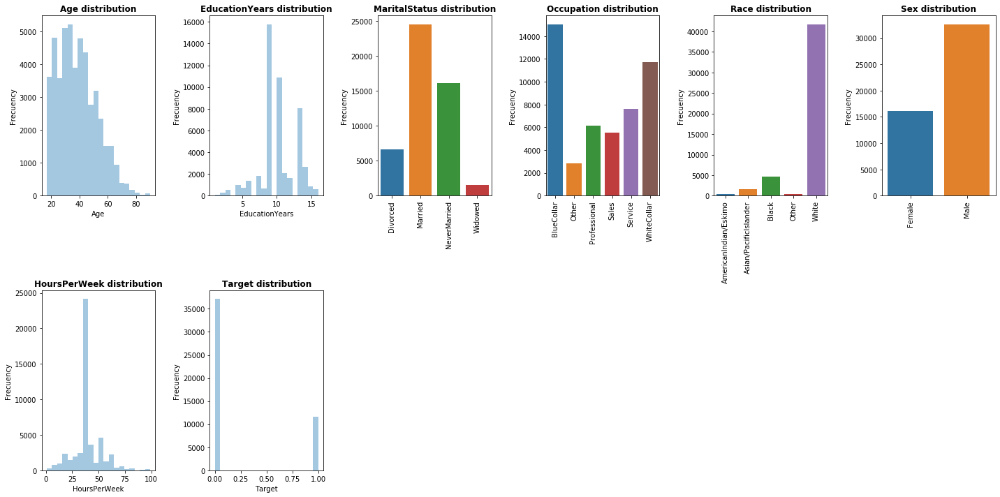

In [17]:
fig = plot_distributions(df_classification, n_cols = 6)
# fig.savefig('plot_distributions.png')

and a naive plot of direct dependences

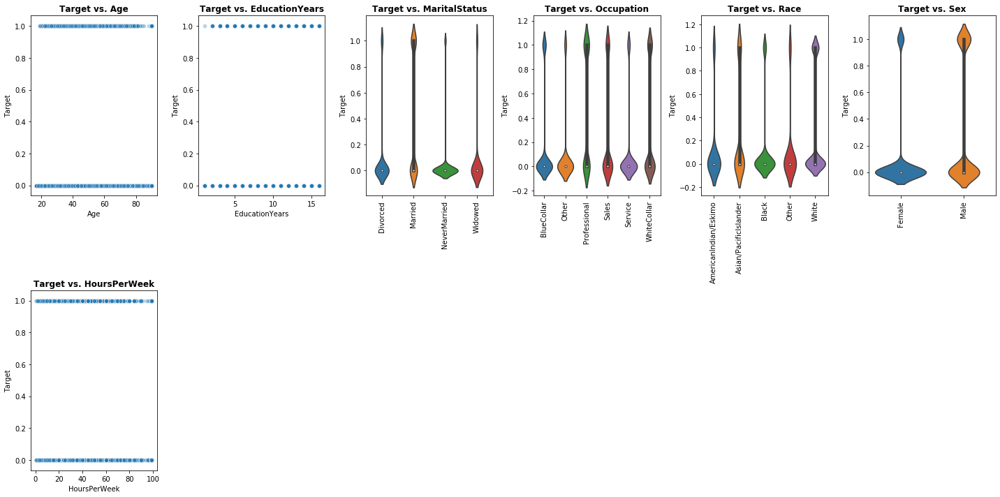

In [18]:
plot_vars_vs_target(df_classification, n_cols = 6)
plt.show()

# Modelling

In [19]:
# Prepare the data for the model
X = df_classification.drop('Target', axis = 1).copy()
y = df_classification['Target'].copy()
    
# Save the original features
features = X.columns.tolist()
categorical_features = [var for var in features if X[var].dtype not in ['int64','float64']]   

# Get dummies for categorical variables
for var in categorical_features:
    X_var = pd.get_dummies(X[var], prefix = var, prefix_sep = '_')
    X = X.drop(var, axis = 1)
    X = pd.concat([X, X_var], axis = 1)

# Create a train set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)

## Interpretable models

### Linear models

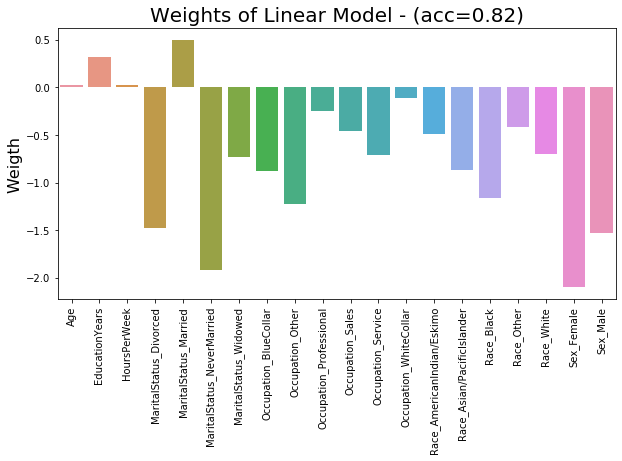

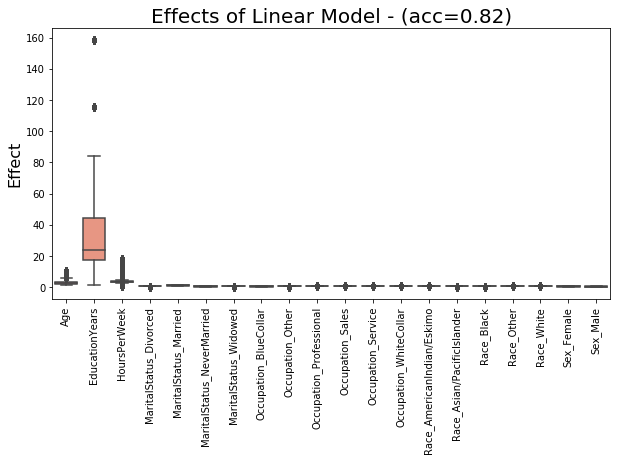

In [20]:
# Initiate and train the model
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Compute weights
df_weights = pd.DataFrame({'Feature' : X.columns, 'Weight' : lr.coef_[0]})

# Compute effects
df_effects = np.exp(np.multiply(X, df_weights.iloc[:,1]))

# Plot weights
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Weight', data = df_weights)
plt.title('Weights of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('')
plt.ylabel('Weigth', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

# Plot effects
plt.figure(figsize = (10, 5))
sns.boxplot(data = df_effects)
plt.title('Effects of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Effect', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

### Tree models

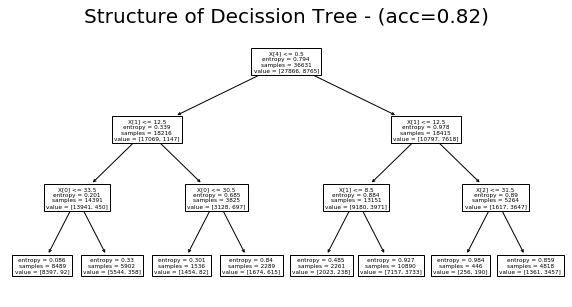

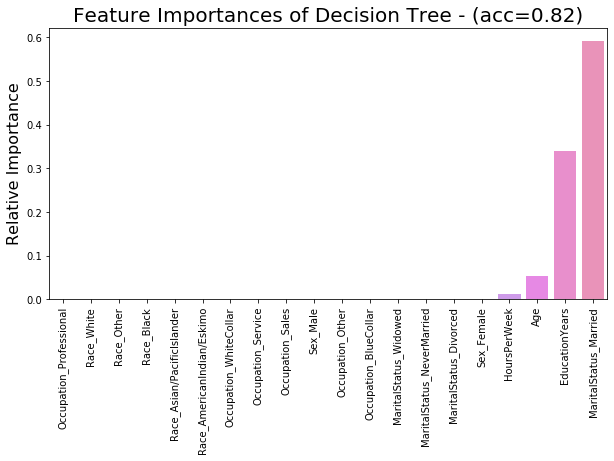

In [21]:
# Initiate and train the model
dtr = DecisionTreeClassifier(max_depth = 3, criterion='entropy')
dtr.fit(X_train, y_train)

# Compute importances
df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : dtr.feature_importances_})
df_importances = df_importances.sort_values(by = 'Importance')

# Plot structure
plt.figure(figsize = (10, 5))
plot_tree(dtr)
plt.title('Structure of Decission Tree - (acc={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
plt.show()

# Plot importances
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
plt.title('Feature Importances of Decision Tree - (acc={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

### Rule models

In [14]:
import mlxtend

ModuleNotFoundError: No module named 'mlxtend'

## Non-interpretable models

### Ranfom Forest

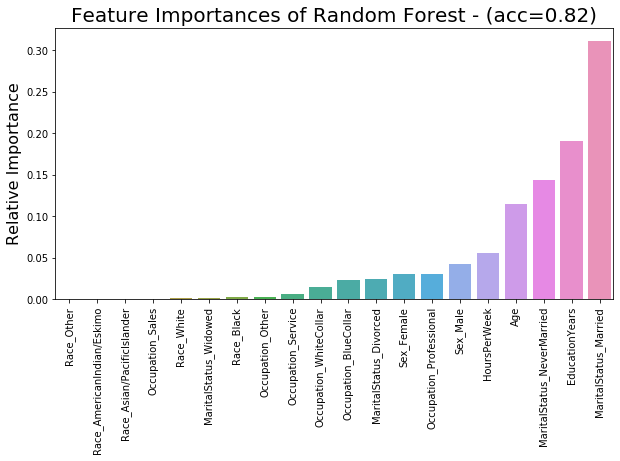

In [22]:
# Initiate and train the model
rfc = RandomForestClassifier(n_estimators = 100, max_depth = 5, criterion = 'entropy')
rfc.fit(X_train, y_train)

# Compute importances
df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : rfc.feature_importances_})
df_importances = df_importances.sort_values(by = 'Importance')

# Plot importances
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
plt.title('Feature Importances of Random Forest - (acc={:.2f})'.format(rfc.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

# Interpretability

## Partial Dependence Plots (PDP)

This library works in such a way that first we have to compute the partial dependences, using:
* **pdpbox.pdp.pdp_isolate**: compute partial dependences for PDP.
    * *model*: a fitted sklearn model.
    * *dataset*: pandas DataFrame. Data set on which the model is trained
    * *model_features*: list or 1-d array. List of model features.
    * *feature*: string or list. Feature or feature list to investigate, for one-hot encoding features, feature list is required
    * *num_grid_points*: integer. Number of grid points for numeric feature, default=10.
    * *grid_type*: string. T, ‘percentile’ or ‘equal’ype of grid points for numeric feature, ‘percentile’ or ‘equal’, default=’percentile’.
* **pdpbox.pdp.pdp_interact**: compute partial dependences, with two features, for PDP.
    * *model*: a fitted sklearn model.
    * *dataset*: pandas DataFrame. Data set on which the model is trained.
    * *model_features*: list or 1-d array. List of model features.
    * *features*: list. [feature1, feature2].
    * *num_grid_points*: list. [feature1 num_grid_points, feature2 num_grid_points].
    * grid_types: list. [feature1 grid_type, feature2 grid_type].

and then we can make the PDP, using:
* **pdpbox.pdp.pdp_plot**: plot partial dependent plot.
    * *pdp_isolate_out*: instance of PDPIsolate.
    * *feature_name*: string. Name of the feature, not necessary a column name.
    * *center*: bool. Whether to center the plot, default=True.
    * *plot_pts_dist*: bool. Whether to show data points distribution, default=False.
    * *plot_lines*: bool. Whether to plot out the individual lines, default=False.
    * *frac_to_plot*: float or integer. How many lines to plot, can be a integer or a float, default=1.
    * *x_quantile*: bool. Whether to construct x axis ticks using quantiles, default=False.
    * *show_percentile*: bool. Whether to display the percentile buckets, for numeric feature when grid_type=’percentile’, default=False.
* **pdpbox.pdp.pdp_interact_plot**: plot interact plot, that is, partial dependence plot with two features.
    * *pdp_interact_out*: instance of PDPInteract.
    * *feature_names*: list. [feature_name1, feature_name2]
    * *plot_type*: str. Type of the interact plot, can be ‘contour’ or ‘grid’, default=’contour’.
    * *x_quantile*: bool. Whether to construct x axis ticks using quantiles, default=False.
    * *plot_pdp*: bool. Whether to plot pdp for each feature, default=False.

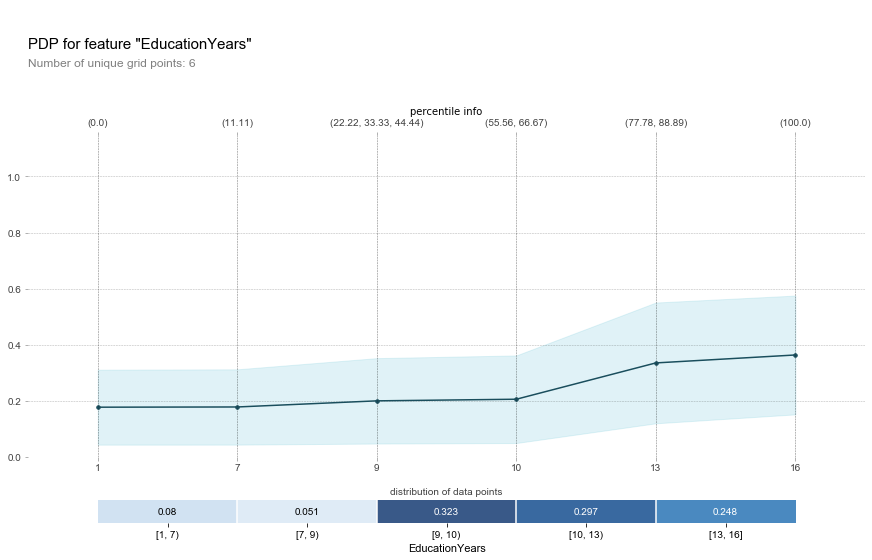

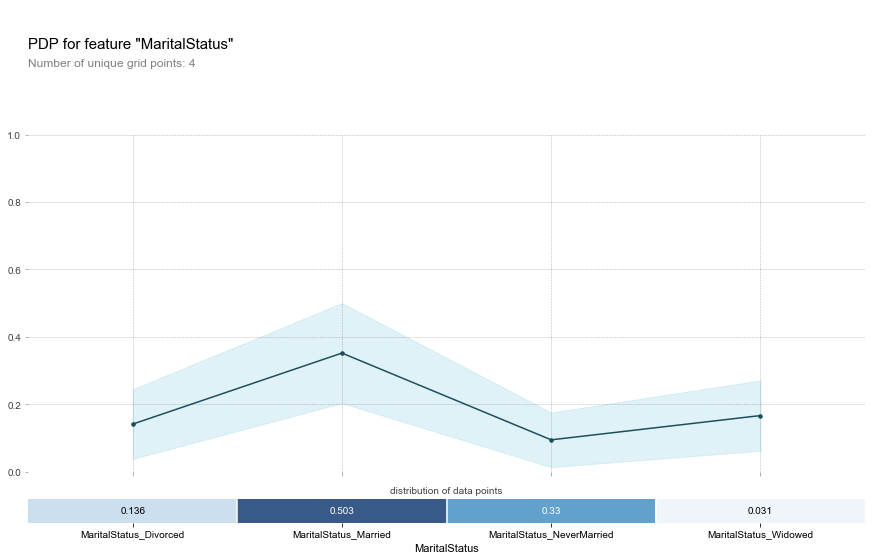

In [24]:
# Numerical variable
pdp_EducationYears = pdp.pdp_isolate(model = rfc,
                                     dataset = X_train,
                                     model_features = X_train.columns.tolist(),
                                     feature = 'EducationYears'
                                     )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                         feature_name = 'EducationYears', 
                         center = False,
                         plot_lines = False,
                         plot_pts_dist = True,
                         x_quantile = True,
                         show_percentile = True
                         )
plt.show()

# Categorical variable
pdp_MaritalStatus = pdp.pdp_isolate(model = rfc, 
                                    dataset = X_train, 
                                    model_features = X_train.columns.tolist(), 
                                    feature = [var for var in X_train.columns.tolist() if 'MaritalStatus' in var]
                                    )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_MaritalStatus, 
                         feature_name = 'MaritalStatus', 
                         center = False,
                         plot_lines = False,
                         plot_pts_dist = True
                         )
plt.show()

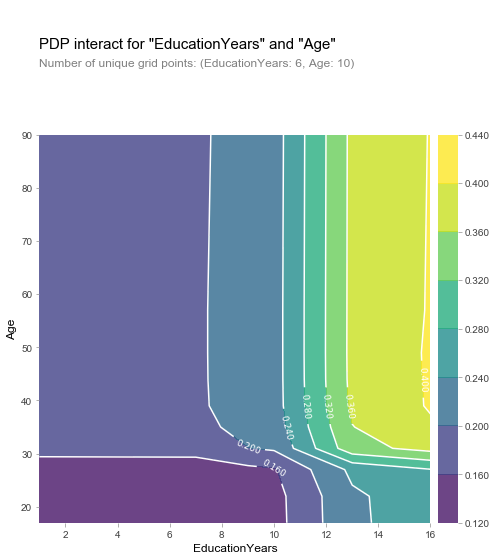

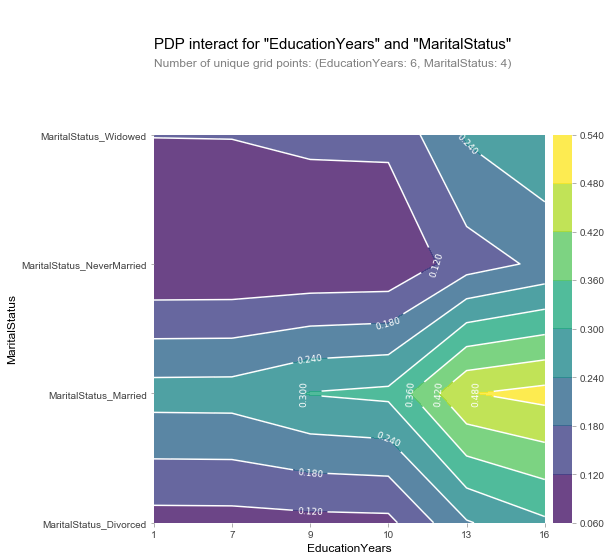

In [25]:
# Numerical variable
pdp_interaction = pdp.pdp_interact(model = rfc,
                                   dataset = X_train,
                                   model_features = X_train.columns.tolist(),
                                   features = ['EducationYears','Age']
                                   )
fig, axes = pdp.pdp_interact_plot(pdp_interact_out = pdp_interaction,
                                  feature_names = ['EducationYears','Age'],
                                  x_quantile = False,
                                  plot_pdp = False,
                                  plot_type = 'contour'
                                  )
plt.show()

# Categorical variable
pdp_interaction = pdp.pdp_interact(model = rfc,
                                   dataset = X_train,
                                   model_features = X_train.columns.tolist(),
                                   features = ['EducationYears', [var for var in X_train.columns.tolist() if 'MaritalStatus' in var]]
                                   )
fig, axes = pdp.pdp_interact_plot(pdp_interact_out = pdp_interaction,
                                  feature_names = ['EducationYears','MaritalStatus'],
                                  x_quantile = True,
                                  plot_pdp = False,
                                  plot_type = 'contour'
                                  )
plt.show()

## Independent Conditional Explanation (ICE)

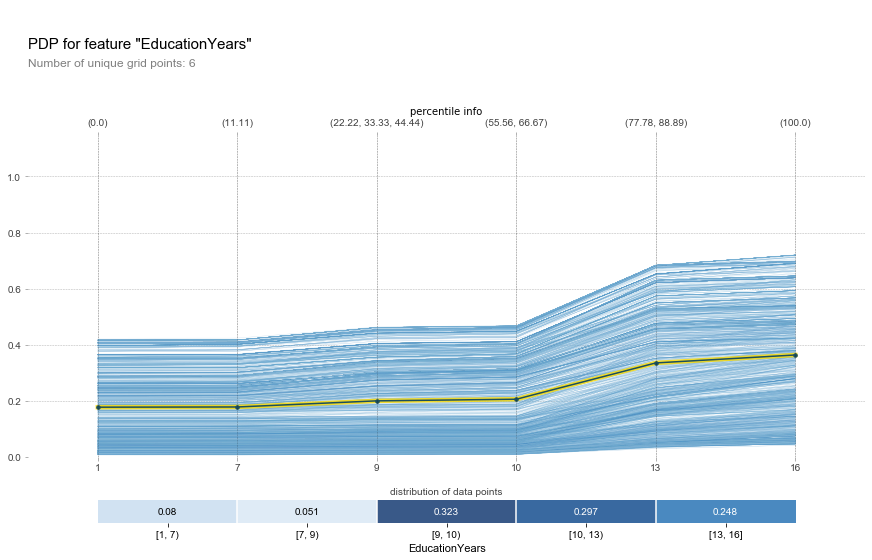

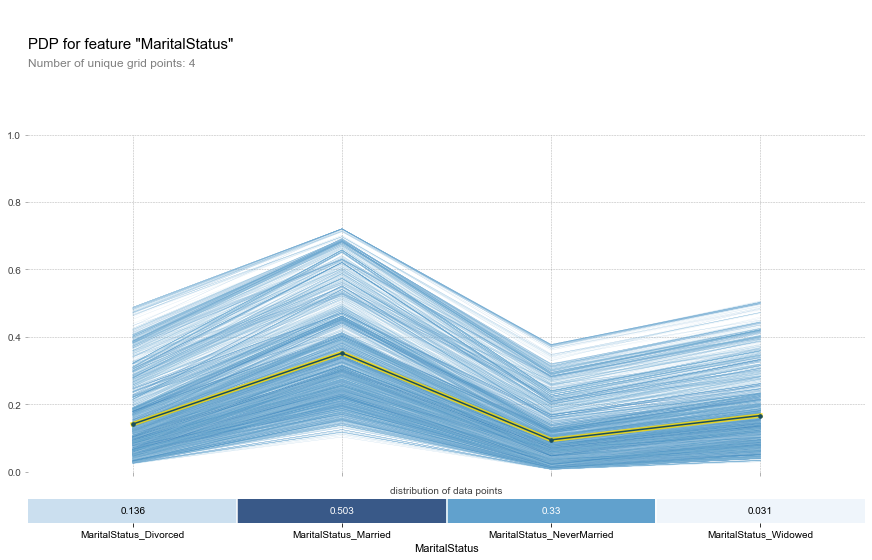

In [27]:
# Numerical variable
pdp_EducationYears = pdp.pdp_isolate(model = rfc,
                                     dataset = X_train,
                                     model_features = X_train.columns.tolist(),
                                     feature = 'EducationYears'
                                     )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                         feature_name = 'EducationYears', 
                         center = False,
                         plot_lines = True,
                         plot_pts_dist = True,
                         x_quantile = True,
                         show_percentile = True,
                         frac_to_plot = 0.1
                         )
plt.show()

# Categorical variable
pdp_MaritalStatus = pdp.pdp_isolate(model = rfc, 
                                    dataset = X_train, 
                                    model_features = X_train.columns.tolist(), 
                                    feature = [var for var in X_train.columns.tolist() if 'MaritalStatus' in var]
                                    )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_MaritalStatus, 
                         feature_name = 'MaritalStatus',
                         center = False,
                         plot_lines = True,
                         plot_pts_dist = True,
                         frac_to_plot = 0.1
                         )
plt.show()

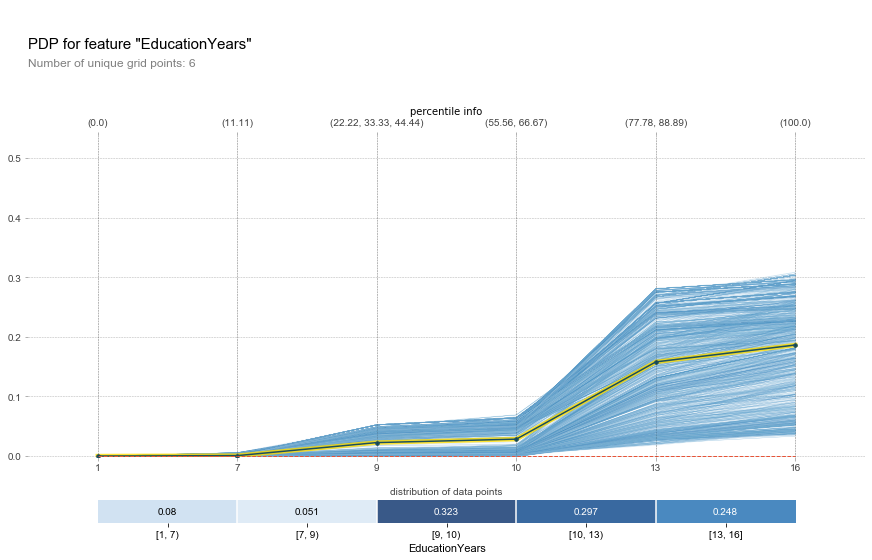

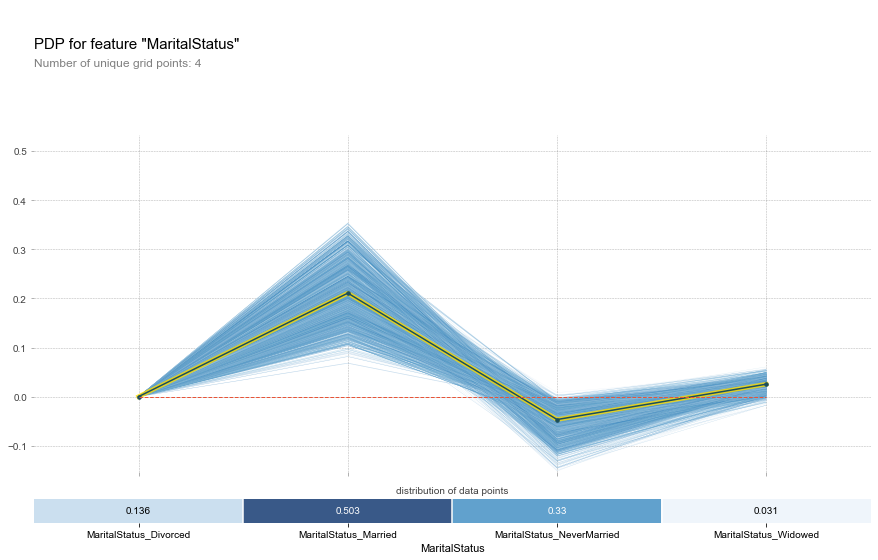

In [28]:
# Numerical variable
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                         feature_name = 'EducationYears', 
                         center = True,
                         plot_lines = True,
                         plot_pts_dist = True,
                         x_quantile = True,
                         show_percentile = True,
                         frac_to_plot = 0.1
                         )
plt.show()

# Categorical variable
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_MaritalStatus, 
                         feature_name = 'MaritalStatus', 
                         center = True,
                         plot_lines = True,
                         plot_pts_dist = True,
                         frac_to_plot = 0.1
                         )
plt.show()

## Accumulated Local Effects (ALE)

This library has only one function:
* **ale_plot**: Plots ALE function of specified features based on training set.
    * *model*: object. An object that implements a 'predict' method. If None, a `predictor` function must be supplied which will be used instead of `model.predict`.
    * *train_set*: pandas.core.frame.DataFrame. Training set on which model was trained.
    * *features*: [2-iterable of] column label. One or two features for which to plot the ALE plot.
    * *bins*: [2-iterable of] int. Number of bins used to split feature's space. 2 integers can only be given when 2 features are supplied in order to compute a different number of quantiles for each feature.
    * *monte_carlo*: boolean. Compute and plot Monte-Carlo samples.
    * *predictor*: callable. Custom prediction function. See `model`.
    * *features_classes*: iterable of str. If features is first-order and a categorical variable, plot ALE according to discrete aspect of data.
    * *monte_carlo_rep*: int. Number of Monte-Carlo replicas.
    * *monte_carlo_ratio*: float. Proportion of randomly selected samples from dataset for each Monte-Carlo replica.
    * *rugplot_lim*: int. If `train_set` has more rows than `rugplot_lim`, no rug plot will be plotted. Set to None to always plot rug plots. Set to 0 to always plot rug plots.

KeyboardInterrupt: 

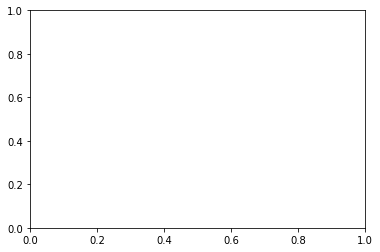

In [29]:
# Numerical variable
ale_plot(model = rfc, 
         train_set = X_train, 
         features = 'EducationYears', 
         bins = 10,
         monte_carlo = True
         )

ale_plot(model = rfc, 
         train_set = X_train, 
         features = 'HoursPerWeek', 
         bins = 10,
         monte_carlo = True
         )

# Categorical variable: NOT IMPLEMENTED YET

In [ ]:
# Numerical variable
ale_plot(model = rfc, 
         train_set = X_train, 
         features = ['EducationYears','HoursPerWeek'], 
         bins = 10,
         monte_carlo = True
         )

# Categorical variable: NOT IMPLEMENTED YET

## Permutation Feature Importance

The **sklearn** library includes the computation of permutation importance for feature evaluation:
* **sklearn.inspection.permutation_importance**: Permutation importance for feature evaluation. The estimator is required to be a fitted estimator. X can be the data set used to train the estimator or a hold-out set. The permutation importance of a feature is calculated as follows. First, a baseline metric, defined by scoring, is evaluated on a (potentially different) dataset defined by the X. Next, a feature column from the validation set is permuted and the metric is evaluated again. The permutation importance is defined to be the difference between the baseline metric and metric from permutating the feature column.
    * *estimator*: object. An estimator that has already been fitted and is compatible with scorer.
    * *X*: ndarray or DataFrame, shape (n_samples, n_features). Data on which permutation importance will be computed.
    * *y*: array-like or None, shape (n_samples, ) or (n_samples, n_classes). Targets for supervised or None for unsupervised.
    * *scoring*: string, callable or None, default=None. Scorer to use. It can be a single string (see The scoring parameter: defining model evaluation rules) or a callable (see Defining your scoring strategy from metric functions). If None, the estimator’s default scorer is used.
    * *n_repeats*: int, default=5. Number of times to permute a feature.

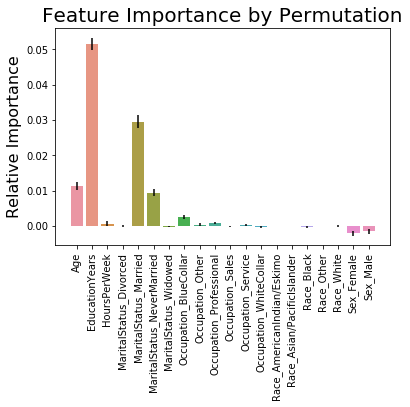

In [30]:
# Compute FPI
pfi = permutation_importance(rfc, 
                             X_test, 
                             y_test,
                             n_repeats = 10,
                             random_state = 0
                             )

# Prepare dataframe 
df_pfi = pd.DataFrame({'Feature'          : X_test.columns, 
                       'importances_mean' : pfi['importances_mean'],
                       'importances_std'  : pfi['importances_std']
                       })

# Make the plot
sns.barplot(x = 'Feature', y = 'importances_mean', data = df_pfi)
plt.errorbar(x = df_pfi['Feature'], 
             y = df_pfi['importances_mean'], 
             yerr = df_pfi['importances_std'],
             color = 'black', 
             linestyle = ''
             )
plt.title('Feature Importance by Permutation', fontsize = 20)
plt.xlabel('')
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

The **eli5** implements several algorithms for inspecting black-box models. Between them, it includes a module for computing FPI for sklearn models. This module generates this values using the function **eli5.sklearn.PermutationImportance**, which uses the following arguments:
* *estimator* (object): The base estimator. This can be both a fitted (if prefit is set to True) or a non-fitted estimator.
* *scoring* (string, callable or None, default=None): Scoring function to use for computing feature importances. A string with scoring name (see scikit-learn docs) or a scorer callable object / function with signature scorer(estimator, X, y). If None, the score method of the estimator is used.
* *n_iter* (int, default 5): Number of random shuffle iterations. Decrease to improve speed, increase to get more precise estimates.

In [32]:
# Compute FPI
perm = PermutationImportance(rfc, n_iter = 10, random_state=0)
perm = perm.fit(X_test, y_test)

# Make the plots
show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0520 ± 0.0047,EducationYears
0.0288 ± 0.0026,MaritalStatus_Married
0.0114 ± 0.0020,Age
0.0089 ± 0.0027,MaritalStatus_NeverMarried
0.0025 ± 0.0015,Occupation_BlueCollar
0.0009 ± 0.0007,Occupation_Professional
0.0006 ± 0.0012,HoursPerWeek
0.0006 ± 0.0003,Occupation_Other
0.0005 ± 0.0008,Occupation_Service
0.0002 ± 0.0012,MaritalStatus_Divorced


## Shapley values

This library includes modules for computing SHAP for various models: 
* *TreeExplainer*: An implementation of Tree SHAP, a fast and exact algorithm to compute SHAP values for trees and ensembles of trees.
* *DeepExplainer*: An implementation of Deep SHAP, a faster (but only approximate) algorithm to compute SHAP values for deep learning models that is based on connections between SHAP and the DeepLIFT algorithm.
* *GradientExplainer*: An implementation of expected gradients to approximate SHAP values for deep learning models. It is based on connections between SHAP and the Integrated Gradients algorithm. GradientExplainer is slower than DeepExplainer and makes different approximation assumptions.
* *LinearExplainer*: For a linear model with independent features we can analytically compute the exact SHAP values. We can also account for feature correlation if we are willing to estimate the feature covaraince matrix. LinearExplainer supports both of these options.
* *KernelExplainer*: An implementation of Kernel SHAP, a model agnostic method to estimate SHAP values for any model. Because it makes not assumptions about the model type, KernelExplainer is slower than the other model type specific algorithms.

We are using *KernelExplainer* by its model-agnosticness. It has the following arguments:
* *model*: function or iml.Model. User supplied function that takes a matrix of samples (# samples x # features) and computes a the output of the model for those samples. The output can be a vector (# samples) or a matrix (# samples x # model outputs).
* *data*: numpy.array or pandas.DataFrame or shap.common.DenseData or any scipy.sparse matrix The background dataset to use for integrating out features. To determine the impact of a feature, that feature is set to “missing” and the change in the model output is observed. Since most models aren’t designed to handle arbitrary missing data at test time, we simulate “missing” by replacing the feature with the values it takes in the background dataset. So if the background dataset is a simple sample of all zeros, then we would approximate a feature being missing by setting it to zero. For small problems this background dataset can be the whole training set, but for larger problems consider using a single reference value or using the kmeans function to summarize the dataset. Note: for sparse case we accept any sparse matrix but convert to lil format for performance.
* *link*: “identity” or “logit”. A generalized linear model link to connect the feature importance values to the model output. Since the feature importance values, phi, sum up to the model output, it often makes sense to connect them to the output with a link function where link(output) = sum(phi). If the model output is a probability then the LogitLink link function makes the feature importance values have log-odds units.

And we can get many different plots:
* **shap.waterfall_plot()**: Plots an explantion of a single prediction as a waterfall plot. The SHAP value of a feature represents the impact of the evidence provided by that feature on the model’s output. The waterfall plot is designed to visually display how the SHAP values (evidence) of each feature move the model output from our prior expectation under the background data distribution, to the final model prediction given the evidence of all the features. Features are sorted by the magnitude of their SHAP values with the smallest magnitude features grouped together at the bottom of the plot when the number of features in the models exceeds the max_display parameter.
    * *shap_values*: Explanation. A one-dimensional Explanation object that contains the feature values and SHAP values to plot.
    * *max_display*: str. The maximum number of features to plot.
    * *show*: bool. Whether matplotlib.pyplot.show() is called before returning. Setting this to False allows the plot to be customized further after it has been created.
* **shap.force_plot**: Visualize the given SHAP values with an additive force layout.
    * *base_value*: float. This is the reference value that the feature contributions start from. For SHAP values it should be the value of explainer.expected_value.
    * *shap_values*: numpy.array. Matrix of SHAP values (# features) or (# samples x # features). If this is a 1D array then a single force plot will be drawn, if it is a 2D array then a stacked force plot will be drawn.
    * *features*: numpy.array. Matrix of feature values (# features) or (# samples x # features). This provides the values of all the features, and should be the same shape as the shap_values argument.
    * *feature_names*: list. List of feature names (# features).
    * *out_names*: str. The name of the output of the model (plural to support multi-output plotting in the future).
    * *link*: “identity” or “logit”. The transformation used when drawing the tick mark labels. Using logit will change log-odds numbers into probabilities.
* **shap.summary_plot()**: Create a SHAP beeswarm plot, colored by feature values when they are provided.
    * *shap_values*: numpy.array. For single output explanations this is a matrix of SHAP values (# samples x # features). For multi-output explanations this is a list of such matrices of SHAP values.
    * *features*: numpy.array or pandas.DataFrame or list. Matrix of feature values (# samples x # features) or a feature_names list as shorthand.
    * *feature_names*: list. Names of the features (length # features)
    * *max_display*: int. How many top features to include in the plot (default is 20, or 7 for interaction plots)
    * *plot_type*: “dot” (default for single output), “bar” (default for multi-output), “violin”, or “compact_dot”. What type of summary plot to produce. Note that “compact_dot” is only used for SHAP interaction values.
* **shap.dependence_plot()**: Create a SHAP dependence plot, colored by an interaction feature. Plots the value of the feature on the x-axis and the SHAP value of the same feature on the y-axis. This shows how the model depends on the given feature, and is like a richer extenstion of the classical parital dependence plots. Vertical dispersion of the data points represents interaction effects. Grey ticks along the y-axis are data points where the feature’s value was NaN.
    * *ind*: int or string. If this is an int it is the index of the feature to plot. If this is a string it is either the name of the feature to plot, or it can have the form “rank(int)” to specify the feature with that rank (ordered by mean absolute SHAP value over all the samples).
    * *shap_values*: numpy.array. Matrix of SHAP values (# samples x # features).
    * *features*: numpy.array or pandas.DataFrame. Matrix of feature values (# samples x # features).
    * *feature_names*: list. Names of the features (length # features).
    * *display_features*: numpy.array or pandas.DataFrame. Matrix of feature values for visual display (such as strings instead of coded values).
    * *interaction_index*: “auto”, None, int, or string. The index of the feature used to color the plot. The name of a feature can also be passed as a string. If “auto” then shap.common.approximate_interactions is used to pick what seems to be the strongest interaction (note that to find to true stongest interaction you need to compute the SHAP interaction values).
    * *x_jitter*: float (0 - 1). Adds random jitter to feature values. May increase plot readability when feature is discrete.
    * *alpha*: float. The transparency of the data points (between 0 and 1). This can be useful to the show density of the data points when using a large dataset.
    * *xmin*: float or string. Represents the lower bound of the plot’s x-axis. It can be a string of the format “percentile(float)” to denote that percentile of the feature’s value used on the x-axis.
    * *xmax*: float or string. Represents the upper bound of the plot’s x-axis. It can be a string of the format “percentile(float)” to denote that percentile of the feature’s value used on the x-axis.
    * *ax*: matplotlib Axes object. Optionally specify an existing matplotlib Axes object, into which the plot will be placed. In this case we do not create a Figure, otherwise we do.

In [53]:
# Initialize JS for plots
shap.initjs()

# Create explainer
explainer = shap.KernelExplainer(model = rfc.predict, 
                                 data = shap.sample(np.array(X_train), 100)
                                 )

# Predict for many instances
shap_values = explainer.shap_values(X_test, nsamples = 10)

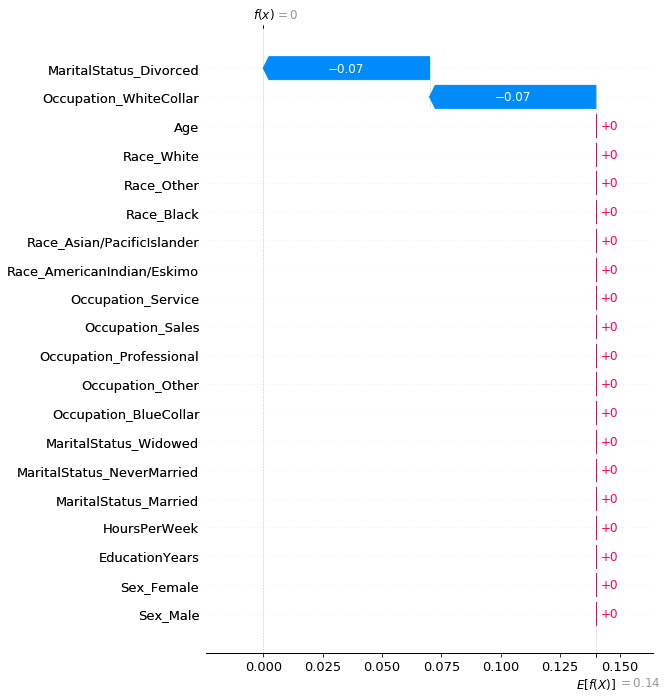

In [58]:
# Predict for single instances
i = 1
shap.plots._waterfall.waterfall_legacy(explainer.expected_value, 
                                       shap_values[i,:], 
                                       feature_names = X_test.columns.values,
                                       max_display = 20
                                       )

In [59]:
shap.force_plot(base_value = explainer.expected_value, 
                shap_values = shap_values[i], 
                features = X_test.iloc[i,:],
                feature_names = X_test.columns.tolist()
                )

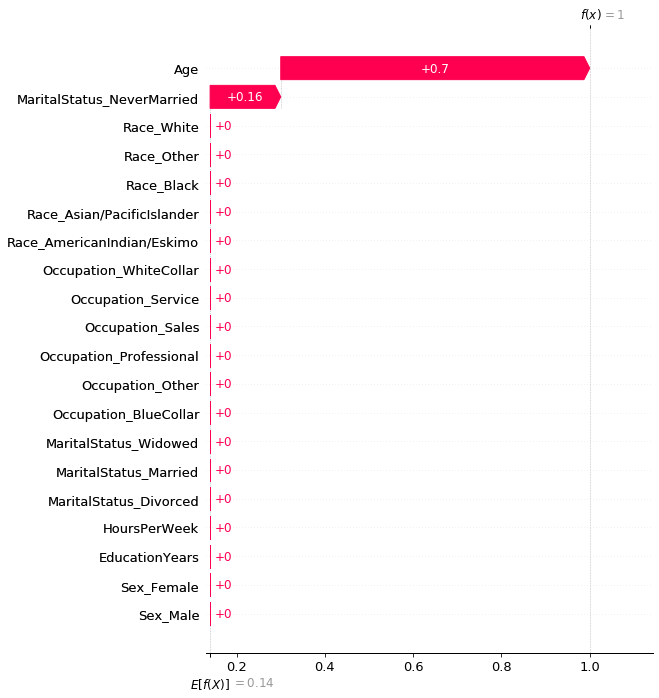

In [60]:
# Predict for single instances
i = 7
shap.plots._waterfall.waterfall_legacy(explainer.expected_value, 
                                       shap_values[i,:], 
                                       feature_names = X_test.columns.values,
                                       max_display = 20
                                       )

In [61]:
shap.force_plot(base_value = explainer.expected_value, 
                shap_values = shap_values[i], 
                features = X_test.iloc[i,:],
                feature_names = X_test.columns.tolist()
                )

In [64]:
# Predict for many instances
shap.force_plot(base_value = explainer.expected_value, 
                shap_values = shap_values[:50], 
                features = X_test.iloc[:50],
                feature_names = X_test.columns.tolist()
                )

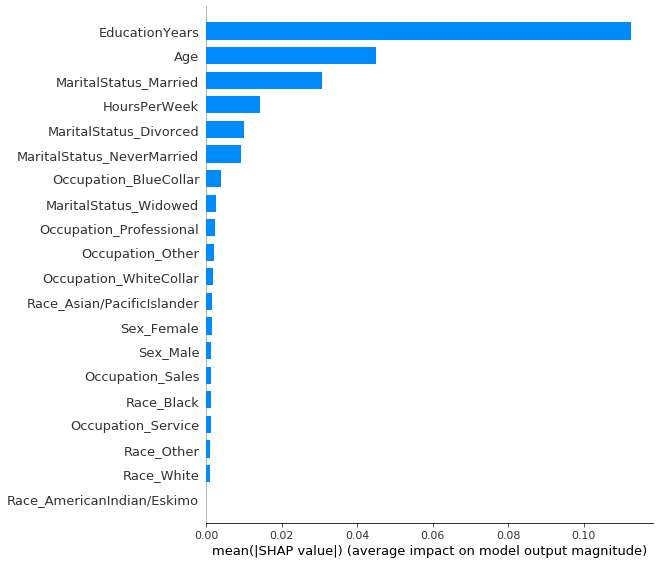

In [65]:
# Get summary plot
shap.summary_plot(shap_values = shap_values, 
                  features = X_test,
                  feature_names = X_test.columns.tolist(),
                  plot_type = "bar"
                  )

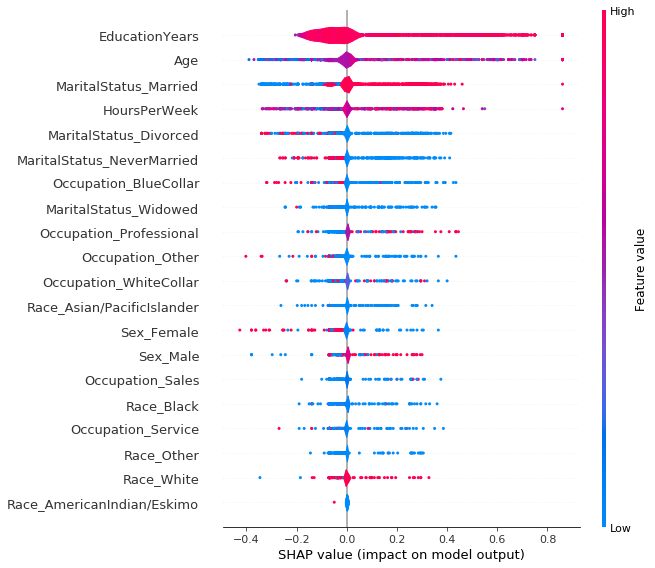

In [66]:
# Get summary plot
shap.summary_plot(shap_values = shap_values, 
                  features = X_test,
                  feature_names = X_test.columns.tolist(),
                  plot_type = "violin"
                  )

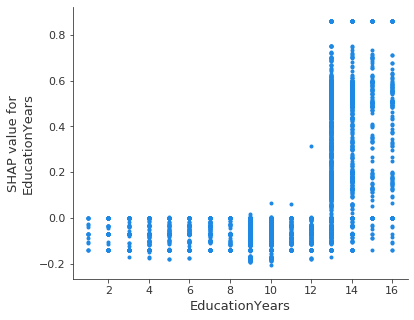

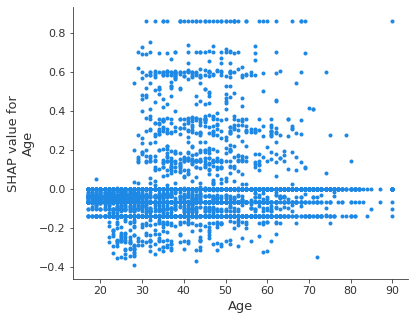

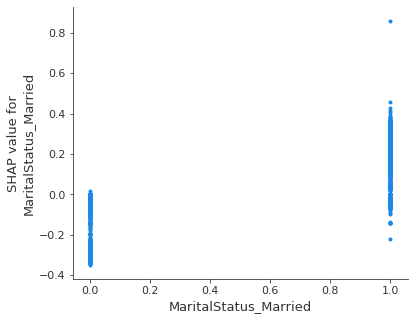

In [67]:
# Get some dependence plots
for i, var in enumerate(['EducationYears','Age','MaritalStatus_Married']):
    shap.dependence_plot(ind = var, 
                         shap_values = shap_values, 
                         features = X_test, 
                         feature_names = X_test.columns, 
                         interaction_index = None
                         )

## Global Surrogate Models

In [68]:
def surrogate_model_linear(model, X_train, y_train, X_test, y_test):
    # Get predictions from the original model
    y_train = model.predict(X_train)
    y_test  = model.predict(X_test)
    
    # Initiate and train the linear model
    lr = LogisticRegression()
    lr.fit(X_train, y_train)
    
    # Compute weights
    df_weights = pd.DataFrame({'Feature' : X_train.columns, 'Weight' : lr.coef_[0]})

    # Compute effects
    df_effects = np.exp(np.multiply(X, df_weights.iloc[:,1]))

    # Plot weights
    plt.figure(figsize = (10, 5))
    sns.barplot(x = 'Feature', y = 'Weight', data = df_weights)
    plt.title('Weights of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('')
    plt.ylabel('Weigth', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

    # Plot effects
    plt.figure(figsize = (10, 5))
    sns.boxplot(data = df_effects)
    plt.title('Effects of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('', fontsize = 16)
    plt.ylabel('Effect', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

In [69]:
def surrogate_model_tree(model, X_train, y_train, X_test, y_test):
    # Get predictions from the original model
    y_train = model.predict(X_train)
    y_test  = model.predict(X_test)
    
    # Initiate and train the model
    dtr = DecisionTreeClassifier(max_depth = 3)
    dtr.fit(X_train, y_train)

    # Compute importances
    df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : dtr.feature_importances_})
    df_importances = df_importances.sort_values(by = 'Importance')

    # Plot structure
    plt.figure(figsize = (10, 5))
    plot_tree(dtr)
    plt.title('Structure of Decission Tree - ($R^2$={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
    plt.show()

    # Plot importances
    plt.figure(figsize = (10, 5))
    sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
    plt.title('Feature Importances of Decision Tree - ($R^2$={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('', fontsize = 16)
    plt.ylabel('Relative Importance', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

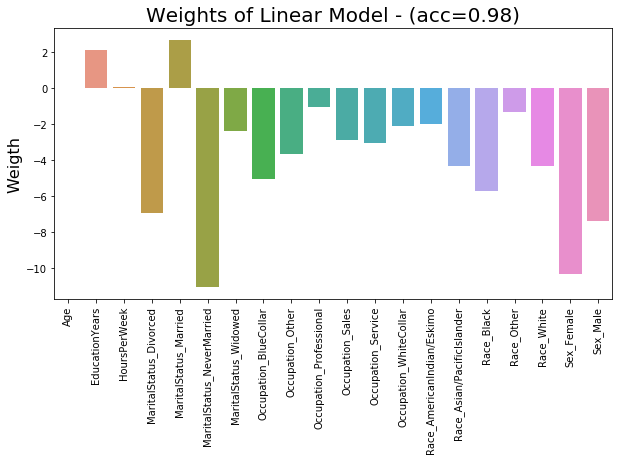

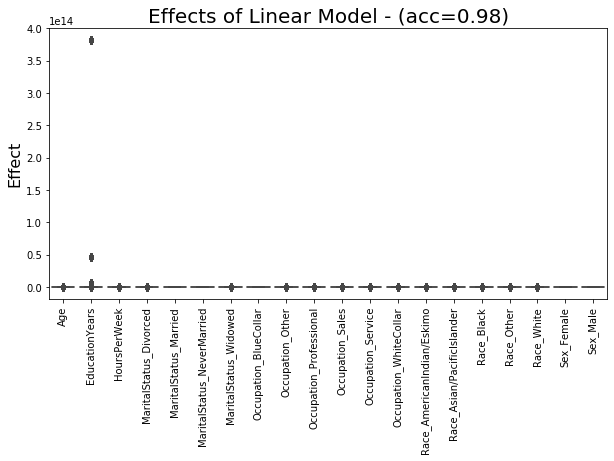

In [70]:
surrogate_model_linear(rfc, X_train, y_train, X_test, y_test)

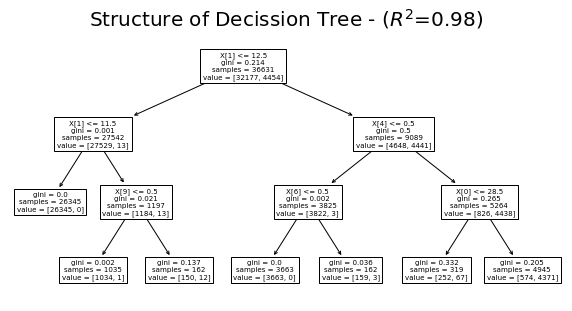

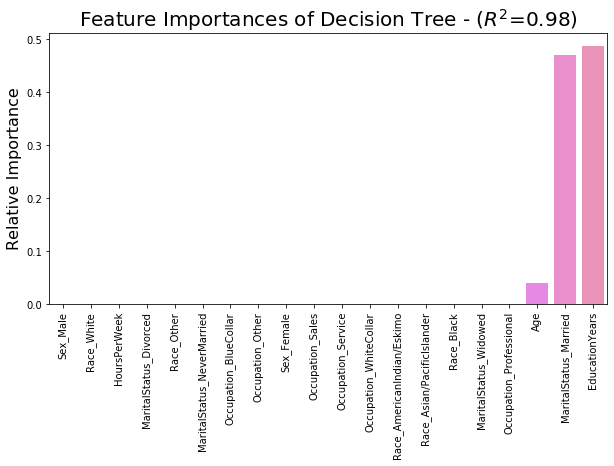

In [71]:
surrogate_model_tree(rfc, X_train, y_train, X_test, y_test)

## LIME

This library includes modules for computing LIME explanations for various types of data, but we are interested only in the case of tabular data: 
* **lime.lime_tabular.LimeTabularExplainer**: Explains predictions on tabular (i.e. matrix) data. For numerical features, perturb them by sampling from a Normal(0,1) and doing the inverse operation of mean-centering and scaling, according to the means and stds in the training data. For categorical features, perturb by sampling according to the training distribution, and making a binary feature that is 1 when the value is the same as the instance being explained.
    * *training_data*: numpy 2d array.
    * *mode*: “classification” or “regression”.
    * *training_labels*: labels for training data. Not required, but may be used by discretizer.
    * *feature_names*: list of names (strings) corresponding to the columns in the training data.
    * *categorical_features*: list of indices (ints) corresponding to the categorical columns. Everything else will be considered continuous. Values in these columns MUST be integers.
    * *categorical_names*: map from int to list of names, where categorical_names\[x\]\[y\] represents the name of the yth value of column x.
    * *kernel_width* – kernel width for the exponential kernel.  If None, defaults to sqrt (number of columns) * 0.75.
    * *verbose*: if true, print local prediction values from linear model.
    * *class_names*: list of class names, ordered according to whatever the classifier is using. If not present, class names will be ‘0’, ‘1’, ...
    * *feature_selection*: feature selection method. can be ‘forward_selection’, ‘lasso_path’, ‘none’ or ‘auto’. See function ‘explain_instance_with_data’ in lime_base.py for details on what each of the options does.
    * *discretize_continuous*: if True, all non-categorical features will be discretized into quartiles.
    * *discretizer*: only matters if discretize_continuous is True. Options are ‘quartile’, ‘decile’ or ‘entropy’.
    
so once the explanations are computed and saved in a explainer object, we can use the *explain_instance* method for generating a graphic report of the explanation for an instance. Each explainer has its particular methods with some slightly different parameters:
* **explain_instance** (lime.lime_tabular.LimeTabularExplainer): Generates explanations for a prediction. First, we generate neighborhood data by randomly perturbing features from the instance (see __data_inverse). We then learn locally weighted linear models on this neighborhood data to explain each of the classes in an interpretable way (see lime_base.py).
    * *data_row*: 1d numpy array, corresponding to a row
    * *predict_fn*: prediction function. For classifiers, this should be a function that takes a numpy array and outputs prediction probabilities. For regressors, this takes a numpy array and returns the predictions. For ScikitClassifiers, this is classifier.predict_proba(). For ScikitRegressors, this is regressor.predict().
    * *labels*: iterable with labels to be explained.
    * *top_labels*: if not None, ignore labels and produce explanations for the K labels with highest prediction probabilities, where K is this parameter.
    * *num_features*: maximum number of features present in explanation
    * *num_samples*: size of the neighborhood to learn the linear model
    * *distance_metric*: the distance metric to use for weights.
    * *model_regressor*: sklearn regressor to use in explanation. Defaults to Ridge regression in LimeBase. Must have model_regressor.coef_ and ‘sample_weight’ as a parameter to model_regressor.fit()

In [72]:
# Get feature names
feature_names = X.columns.tolist()
categorical_features = {i : col for i, col in enumerate(X_train.columns) if ('_' in col)}

# Create explainer
explainer = LimeTabularExplainer(np.array(X_train), 
                                 feature_names = feature_names, 
                                 class_names = ['<=50K','50K<'], 
                                 categorical_features = categorical_features, 
                                 verbose = True, 
                                 mode = 'classification')

# Explain some instance prediction
i = 1
exp = explainer.explain_instance(np.array(X_test)[i], rfc.predict_proba, num_features=5)
exp.show_in_notebook(show_table = True)
html = exp.as_html()
for x in exp.as_list():
    print(x)

Intercept 0.34699099122986976
Prediction_local [0.06257897]
Right: 0.04514611845947987


('MaritalStatus_Married=0', -0.15555068672826114)
('MaritalStatus_NeverMarried=1', -0.0737533403586396)
('Occupation_Professional=0', -0.05747617029103565)
('Occupation_BlueCollar=0', 0.03532855671341384)
('Sex_Male=0', -0.03296038423592271)


In [73]:
i = 7
exp = explainer.explain_instance(np.array(X_test)[i], rfc.predict_proba, num_features=5)
exp.show_in_notebook(show_table = True)
html = exp.as_html()
for x in exp.as_list():
    print(x)

Intercept 0.07216183781734717
Prediction_local [0.46147556]
Right: 0.6574995114076487


('MaritalStatus_Married=1', 0.16281287677281553)
('EducationYears > 12.00', 0.14233554955726505)
('MaritalStatus_NeverMarried=0', 0.0759652056313833)
('Occupation_Professional=1', 0.05918560595158385)
('HoursPerWeek <= 40.00', -0.05098551206814567)


## Anchors

An anchor explanation is a rule that sufficiently "anchors" the prediction locally – such that changes to the rest of the feature values of the instance do not matter. In other words, for instances on which the anchor holds, the prediction is (almost) always the same. The anchor method is able to explain any black box classifier, with two or more classes. All we require is that the classifier implements a function that takes in raw text or a numpy array and outputs a prediction.

We are interested in the tabular implementation of the model:
* **anchor.anchor_tabular.AnchorTabularExplainer**:
    * *class_names*: labels for the classes
    * *feature_names*: labels for the features
    * *train_data*: np.array with the data
    * *categorical_names*: map from integer to list of strings, names for each value of the categorical features. Every feature that is not in this map will be considered as ordinal or continuous, and thus discretized.

In [74]:
# Get feature names
feature_names = X.columns.tolist()
categorical_features = {i : ['0','1'] for i, col in enumerate(X_train.columns) if ('_' in col)}

# Create explainer
explainer = AnchorTabularExplainer(train_data = np.array(X_train),
                                   class_names = ['<=50K','50K<'],
                                   feature_names = feature_names,
                                   categorical_names = categorical_features
                                   )

# Explain some instance prediction
i = 1
display(X_test.iloc[i])
exp = explainer.explain_instance(np.array(X_test)[i].reshape(1, -1), rfc.predict, threshold=0.95)
exp.show_in_notebook()

Age                           30.0
EducationYears                11.0
HoursPerWeek                  41.0
MaritalStatus_Divorced         0.0
MaritalStatus_Married          0.0
MaritalStatus_NeverMarried     1.0
MaritalStatus_Widowed          0.0
Occupation_BlueCollar          0.0
Occupation_Other               0.0
Occupation_Professional        0.0
Occupation_Sales               0.0
Occupation_Service             1.0
Occupation_WhiteCollar         0.0
Race_AmericanIndian/Eskimo     0.0
Race_Asian/PacificIslander     0.0
Race_Black                     0.0
Race_Other                     0.0
Race_White                     1.0
Sex_Female                     1.0
Sex_Male                       0.0
Name: 8303, dtype: float64

In [75]:
i = 7
display(X_test.iloc[i])
exp = explainer.explain_instance(np.array(X_test)[i].reshape(1, -1), rfc.predict, threshold=0.95)
exp.show_in_notebook()

Age                           45.0
EducationYears                14.0
HoursPerWeek                  40.0
MaritalStatus_Divorced         0.0
MaritalStatus_Married          1.0
MaritalStatus_NeverMarried     0.0
MaritalStatus_Widowed          0.0
Occupation_BlueCollar          0.0
Occupation_Other               0.0
Occupation_Professional        1.0
Occupation_Sales               0.0
Occupation_Service             0.0
Occupation_WhiteCollar         0.0
Race_AmericanIndian/Eskimo     0.0
Race_Asian/PacificIslander     0.0
Race_Black                     0.0
Race_Other                     0.0
Race_White                     1.0
Sex_Female                     0.0
Sex_Male                       1.0
Name: 13360, dtype: float64

## Counterfatual explanations

The library alibi (an alibi, in spanish *Coartada*, is a form of defense used in criminal procedure wherein the accused attempts to prove that they were in some other place at the time the alleged offense was committed) provides an high-quality implementations of black-box, white-box, local and global explanation methods for classification and regression models.

We are interested in the implemetations regarding counterfactuals:
* **alibi.explainers.CounterFactual**: besides passing the model, we have to set a large number of hyperparameters:
    * General:  
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
        * *write_dir*: write directory for Tensorboard logging of the loss terms. It can be helpful when tuning the hyperparameters for your use case. It makes it easy to verify that e.g. not 1 loss term dominates the optimization, that the number of iterations is OK etc. You can access Tensorboard by running tensorboard --logdir {write_dir} in the terminal.
        * *debug*: flag to enable/disable writing to Tensorboard.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of λ; the multiplier of the distance loss term.
        * *learning_rate_init*: initial learning rate, follows linear decay.
        * *decay*: flag to disable learning rate decay if desired
        * *early_stop*: early stopping criterion for the search. If no counterfactuals are found for this many steps or if this many counterfactuals are found in a row we change λ accordingly and continue the search.
        * *init*: how to initialize the search, currently only "identity" is supported meaning the search starts from the original instance.
    * Objective function:
        * *distance_fn*: distance function between the test instance X and the proposed counterfactual X′, currently only "l1" is supported.
        * *target_proba*: desired target probability for the returned counterfactual instance. Defaults to 1.0, but it could be useful to reduce it to allow a looser definition of a counterfactual instance.
        * *tol*: the tolerance within the target_proba, this works in tandem with target_proba to specify a range of acceptable predicted probability values for the counterfactual.
        * *target_class*: desired target class for the returned counterfactual instance. Can be either an integer denoting the specific class membership or the string other which will find a counterfactual instance whose predicted class is anything other than the class of the test instance.
        * *lam_init*: initial value of the hyperparameter λ. This is set to a high value λ=1e−1 and annealed during the search to find good bounds for λ and for most applications should be fine to leave as default.
        * *max_lam_steps*: the number of steps (outer loops) to search for with a different value of λ.

In [159]:
# Create explainer
cf = alibi.explainers.CounterFactual(rfc.predict_proba, 
                                     (1,X_train.shape[1]),
                                     target_class = 1,
                                     target_proba = 0.5,
                                     tol = 0.25,
                                     lam_init = 50
                                     )

# Explain some instance prediction
i = 0
exp = cf.explain(np.array(X_test.iloc[i]).reshape(1,-1))
cf = pd.DataFrame({'Original': np.array(X_test.iloc[i]), 'Counterfactual': exp['cf']['X'][0]}, index = X_test.columns)
display(cf)

UnboundLocalError: local variable 'lb_ix' referenced before assignment

* **alibi.explainers.CounterFactualProto**: besides passing the predictive, and (optional) autoencoder and models, we set a number of hyperparameters:
    * General:
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
        * *write_dir*: write directory for Tensorboard logging of the loss terms. It can be helpful when tuning the hyperparameters for your use case. It makes it easy to verify that e.g. not 1 loss term dominates the optimization, that the number of iterations is OK etc. You can access Tensorboard by running tensorboard --logdir {write_dir} in the terminal. The figure below for example shows the loss to be optimized over different c iterations. It is clear that within each iteration, the number of max_iterations steps is too high and we can speed up the search.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of c; the multiplier of the first loss term.
        * *learning_rate_init*: initial learning rate, follows polynomial decay.
        * *clip*: min and max gradient values.
    * Objective function:
        * *c_init* and *c_steps*: the multiplier c of the first loss term is updated for c_steps iterations, starting at c_init. The first loss term encourages the perturbed instance to be predicted as a different class than the original instance. If we find a candidate counterfactual for the current value of c, we reduce the value of c for the next optimization cycle to put more emphasis on the other loss terms and improve the solution. If we cannot find a solution, c is increased to put more weight on the prediction class restrictions of the counterfactual.
        * *kappa*: the first term in the loss function is defined by a difference between the predicted probabilities for the perturbed instance of the original class and the max of the other classes. κ≥0 defines a cap for this difference, limiting its impact on the overall loss to be optimized. Similar to CEM, we set κ to 0 in the examples.
        * *beta*: $\beta$ is the L1 loss term multiplier. A higher value for $\beta$ means more weight on the sparsity restrictions of the perturbations. $\beta$ equal to 0.1 works well for the example datasets.
        * *gamma*: multiplier for the optional L2 reconstruction error. A higher value for $\gamma$ means more emphasis on the reconstruction error penalty defined by the autoencoder. A value of 100 is reasonable for the examples.
        * *theta*: multiplier for the Lproto loss term. A higher θ means more emphasis on the gradients guiding the counterfactual towards the nearest class prototype. A value of 100 worked well for the examples.
        * *cat_vars*: if the categorical variables have ordinal encodings, this is a dictionary with as keys the categorical columns and values the number of categories for the categorical variable in the dataset. If one-hot encoding is applied to the data, then the keys of the cat_vars dictionary represent the column where each categorical variable starts while the values still return the number of categories.
        * *ohe*: a flag (True or False) whether the categories are one-hot encoded.

In [30]:
beta = .01
c_init = 1.
c_steps = 5
max_iterations = 500
rng = (-1., 1.)  # scale features between -1 and 1
rng_shape = (1,) + X_train.shape[1:]
feature_range = (np.array(X_train).min(axis = 0).reshape((1,X_train.shape[1]))-.1, np.array(X_train).max(axis = 0).reshape((1,X_train.shape[1]))+.1) 
    
    
    # Create explainer
cf = alibi.explainers.CounterFactualProto(rfc.predict_proba, (1,X_train.shape[1]), beta=beta,
                         cat_vars=cat_vars_ord,
                         max_iterations=max_iterations,
                         feature_range=feature_range,
                         c_init=c_init,
                         c_steps=c_steps,
                         eps=(.01, .01))
cf.explain(np.array(X_test)[1].reshape(1,-1))

# Explain some instance prediction
for i in [0,7]:
    exp = cf.explain(np.array(X_test)[1].reshape(1,-1))
    print(exp)

NameError: name 'cat_vars_ord' is not defined

* **alibi.explainers.CEM**: besides passing the the predictive and auto-encoder models, we set a number of hyperparameters:
    * General:
        * *mode*: ‘PN’ or ‘PP’.
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of c; the multiplier of the first loss term.
        * *learning_rate_init*: initial learning rate, follows polynomial decay.
        * *clip*: min and max gradient values.
    * Non-informative value:
        * *no_info_val*: as explained in the previous section, it is important to define which feature values are considered background and not crucial for the class predictions. For MNIST images scaled between 0 and 1 or -0.5 and 0.5 as in the notebooks, pixel perturbations in the direction of the (low) background pixel value can be seen as removing features, moving towards the non-informative value. As a result, the no_info_val parameter is set at a low value like -1. no_info_val can be defined globally or feature-wise. For most applications, domain knowledge becomes very important here. If a representative sample of the training set is available, we can always (naively) infer a no_info_val by taking the feature-wise median or mean:
    * Objective function:
        * *c_init* and *c_steps*: the multiplier 𝑐 of the first loss term is updated for c_steps iterations, starting at c_init. The first loss term encourages the perturbed instance to be predicted as a different class for a PN and the same class for a PP. If we find a candidate PN or PP for the current value of 𝑐, we reduce the value of 𝑐 for the next optimization cycle to put more emphasis on the regularization terms and improve the solution. If we cannot find a solution, 𝑐 is increased to put more weight on the prediction class restrictions of the PN and PP before focusing on the regularization.
        * *kappa*: the first term in the loss function is defined by a difference between the predicted probabilities for the perturbed instance of the original class and the max of the other classes. 𝜅≥0 defines a cap for this difference, limiting its impact on the overall loss to be optimized. Similar to the original paper, we set 𝜅 to 0. in the examples.
        * *beta*: 𝛽 is the 𝐿1 loss term multiplier. A higher value for 𝛽 means more weight on the sparsity restrictions of the perturbations. Similar to the paper, we set 𝛽 to 0.1 for the MNIST and Iris datasets.
        * *gamma*: multiplier for the optional 𝐿2 reconstruction error. A higher value for 𝛾 means more emphasis on the reconstruction error penalty defined by the auto-encoder. Similar to the paper, we set 𝛾 to 100 when we have an auto-encoder available.

In [31]:
# Create explainer
cem = alibi.explainers.CEM(rfc.predict_proba, 
          mode = 'PN', 
          shape = (1,X_train.shape[1]), 
          feature_range = (np.array(X_train).min(axis = 0).reshape((1,X_train.shape[1]))-.1, np.array(X_train).max(axis = 0).reshape((1,X_train.shape[1]))+.1) ,
          max_iterations = 1000,
          learning_rate_init = 1e-2,
          kappa = 0.2, 
          beta = 0.1,
          gamma = 100, 
          c_init = 100.0, 
          c_steps = 10, 
          clip = (-1000.0,1000.0)
          )

exp = cf.explain(np.array(X_test)[1].reshape(1,-1))
print(exp)

No appropriate lambda range found, try decreasing lam_init
Traceback (most recent call last):
  File "/home/pablo/anaconda3/lib/python3.7/site-packages/alibi/explainers/counterfactual.py", line 522, in _minimize_loss
    lb_ix = np.where(cf_count > 0)[0][1]  # take the second order of magnitude with some CFs as lower-bound
IndexError: index 1 is out of bounds for axis 0 with size 0


UnboundLocalError: local variable 'lb_ix' referenced before assignment